In [46]:
# Import libraries and loading the csv file
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import missingno as msno
import plotly.express as px
import sweetviz as sv
from kmodes.kprototypes import KPrototypes
import scipy.stats as stats
from scipy.stats import chi2
vehicles_data_initial = pd.read_csv(r'C:\Users\Admin\Downloads\vehicles.csv')

In [47]:
vehicles_data =  vehicles_data_initial.copy()
sample = vehicles_data_initial.copy()

In [48]:
vehicles_data[vehicles_data["price"] == 0]

,id,url,region,region_url,price,year,manufacturer,model,condition,cylinders,...,size,type,paint_color,image_url,description,county,state,lat,long,posting_date
10,7218893038,https://elpaso.craigslist.org/ctd/d/el-paso-20...,el paso,https://elpaso.craigslist.org,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,tx,NaN,NaN,NaN
11,7218325704,https://elpaso.craigslist.org/ctd/d/el-paso-20...,el paso,https://elpaso.craigslist.org,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,tx,NaN,NaN,NaN
12,7217788283,https://elpaso.craigslist.org/ctd/d/el-paso-20...,el paso,https://elpaso.craigslist.org,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,tx,NaN,NaN,NaN
13,7217147606,https://elpaso.craigslist.org/ctd/d/el-paso-20...,el paso,https://elpaso.craigslist.org,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,tx,NaN,NaN,NaN
14,7209027818,https://elpaso.craigslist.org/ctd/d/el-paso-20...,el paso,https://elpaso.craigslist.org,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,tx,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426764,7303347225,https://wyoming.craigslist.org/ctd/d/casper-pe...,wyoming,https://wyoming.craigslist.org,0,2018.0,NaN,peterbilt 579,NaN,NaN,...,NaN,NaN,NaN,https://images.craigslist.org/00F0F_kfjCcZyncy...,"◄ PRICES STARTING AT $57,500 ($57,500 and up, ...",NaN,wy,42.862274,-106.307144,2021-04-07T15:15:05-0600
426812,7302877815,https://wyoming.craigslist.org/ctd/d/frederick...,wyoming,https://wyoming.craigslist.org,0,2006.0,toyota,scion tc,excellent,4 cylinders,...,NaN,NaN,silver,https://images.craigslist.org/00B0B_dqmLwdZw8Q...,2006 *** TOYOTA SCION TC *** Call or Text ...,NaN,wy,40.114685,-104.971971,2021-04-06T17:00:19-0600
426832,7302353283,https://wyoming.craigslist.org/ctd/d/frederick...,wyoming,https://wyoming.craigslist.org,0,2004.0,toyota,prius,excellent,4 cylinders,...,NaN,NaN,blue,https://images.craigslist.org/00V0V_7Ap4arGS9S...,"2004 *** TOYOTA PRIUS *** Call or Text ""To...",NaN,wy,40.114685,-104.971971,2021-04-05T17:00:55-0600
426836,7302301268,https://wyoming.craigslist.org/ctd/d/dassel-20...,wyoming,https://wyoming.craigslist.org,0,2018.0,ram,2500,excellent,6 cylinders,...,full-size,truck,white,https://images.craigslist.org/00i0i_3cSpgdy0qQ...,Phone: 320-275-2150 2018 RAM 2500 Tradesman ...,NaN,wy,45.082436,-94.334686,2021-04-05T15:18:42-0600


In [49]:
vehicles_data.drop(vehicles_data[vehicles_data['price'] == 0].index, inplace = True)

In [50]:
vehicles_data.shape

(393985, 26)

In [51]:
percent_missing = vehicles_data.isnull().sum() * 100 / len(vehicles_data)
missing_value_df = pd.DataFrame({'column_name': vehicles_data.columns,
                                 'percent_missing': percent_missing})

In [52]:
missing_value_df

,column_name,percent_missing
id,id,0.000000
url,url,0.000000
region,region,0.000000
region_url,region_url,0.000000
price,price,0.000000
year,year,0.297727
manufacturer,manufacturer,4.108024
model,model,1.193193
condition,condition,38.425067
cylinders,cylinders,40.714748


<AxesSubplot:>

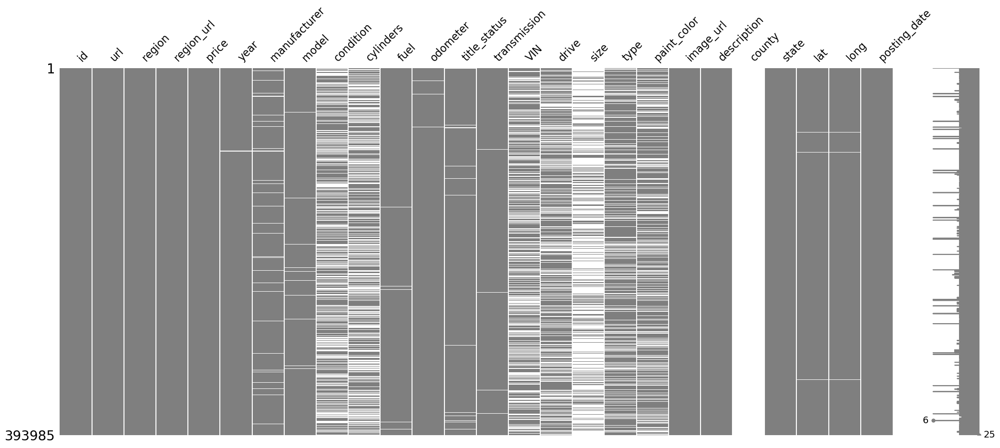

In [53]:
msno.matrix(vehicles_data, color = (0.5, 0.5, 0.5))

In [54]:
vehicles_data.describe()

,id,price,year,odometer,county,lat,long
count,3.939850e+05,3.939850e+05,392812.000000,3.916950e+05,0.0,390496.000000,390496.000000
mean,7.311481e+09,8.147763e+04,2011.006115,9.872951e+04,NaN,38.513981,-94.447916
std,4.472202e+06,1.268064e+07,9.630905,2.059158e+05,NaN,5.874939,18.194385
min,7.207408e+09,1.000000e+00,1900.000000,0.000000e+00,NaN,-84.122245,-159.827728
25%,7.308131e+09,7.000000e+03,2008.000000,3.800000e+04,NaN,34.620000,-111.236250
50%,7.312626e+09,1.500000e+04,2013.000000,8.700000e+04,NaN,39.254962,-88.049143
75%,7.315250e+09,2.759000e+04,2017.000000,1.353340e+05,NaN,42.418524,-80.832039
max,7.317101e+09,3.736929e+09,2022.000000,1.000000e+07,NaN,82.390818,173.885502


In [55]:
vehicles_data.drop(['url', 'region_url','image_url','county','VIN','size','posting_date','model','description'], axis=1,inplace = True)

In [56]:
vehicles_data.drop(vehicles_data[vehicles_data['year'] < 1990].index, inplace = True)

In [57]:
vehicles_data.dropna(axis = 0,thresh=17,inplace = True)

In [58]:
vehicles_data.shape

(107980, 17)

In [59]:
vehicles_data.dropna(subset=['manufacturer','odometer','title_status','fuel',
                               'transmission','lat','long','year','state'], inplace = True)

In [60]:
vehicles_data.isna().sum()

id              0
region          0
price           0
year            0
manufacturer    0
condition       0
cylinders       0
fuel            0
odometer        0
title_status    0
transmission    0
drive           0
type            0
paint_color     0
state           0
lat             0
long            0
dtype: int64

In [61]:
vehicles_data.shape

(107980, 17)

<AxesSubplot:>

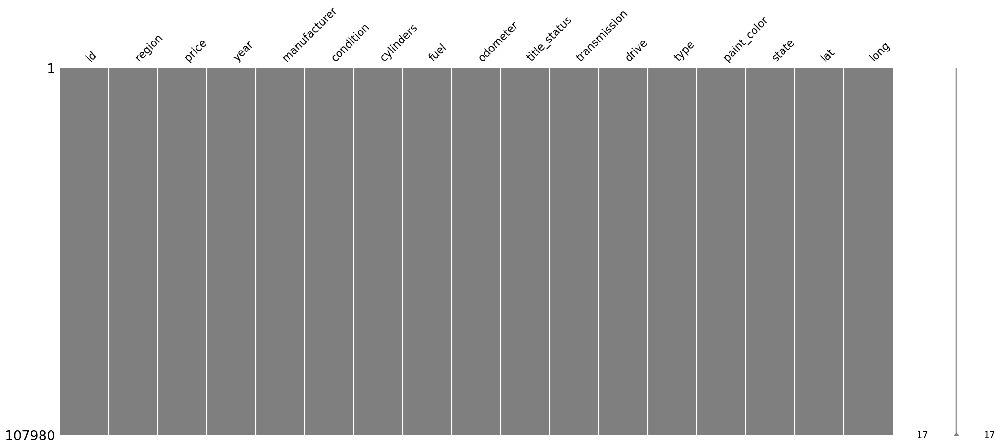

In [62]:
msno.matrix(vehicles_data, color = (0.5, 0.5, 0.5))

In [63]:
# To find records with fuel as electric and cylinders as NULL
condition1 = pd.isna(vehicles_data_initial["cylinders"])
condition2 = vehicles_data["fuel"] == 'electric'

In [64]:
# Use the & operator to combine the conditions
filtered_df = vehicles_data[condition1 & condition2]

In [65]:
# imputing electric car cylinders to 0
vehicles_data['cylinders'] = np.where(pd.isna(vehicles_data["cylinders"]) & (vehicles_data["fuel"] == 'electric')
                                      ,'0 cylinders',vehicles_data['cylinders'])

In [66]:
vehicles_data['cylinders'] = np.where((vehicles_data['fuel'] == 'electric') & (vehicles_data['cylinders'] != '0 cylinders'),'0 cylinders', vehicles_data['cylinders'])

In [67]:
vehicles_data['cylinders'] = vehicles_data['cylinders'].replace('other','7 cylinders')

In [68]:
vehicles_data['cylinders'].value_counts()

6 cylinders     40954
4 cylinders     33874
8 cylinders     30830
5 cylinders       881
10 cylinders      854
3 cylinders       199
0 cylinders       184
7 cylinders       150
12 cylinders       54
Name: cylinders, dtype: int64

In [69]:
vehicles_data['cylinders'] = vehicles_data['cylinders'].str.replace(r'[^0-9]', '')
vehicles_data['cylinders'] = pd.to_numeric(vehicles_data['cylinders']) #.astype(str)
print(vehicles_data.shape)
vehicles_data.dtypes

(107980, 17)


id                int64
region           object
price             int64
year            float64
manufacturer     object
condition        object
cylinders         int64
fuel             object
odometer        float64
title_status     object
transmission     object
drive            object
type             object
paint_color      object
state            object
lat             float64
long            float64
dtype: object

In [70]:
percent_missing = vehicles_data.isnull().sum() * 100 / len(vehicles_data)
missing_value_df = pd.DataFrame({'column_name': vehicles_data.columns,
                                 'percent_missing': percent_missing})

In [71]:
missing_value_df

,column_name,percent_missing
id,id,0.0
region,region,0.0
price,price,0.0
year,year,0.0
manufacturer,manufacturer,0.0
condition,condition,0.0
cylinders,cylinders,0.0
fuel,fuel,0.0
odometer,odometer,0.0
title_status,title_status,0.0


In [72]:
# Dropping Null values from Type

vehicles_data.dropna(subset=['type'], inplace = True)

In [73]:
vehicles_data.shape

(107980, 17)

In [74]:
percent_missing = vehicles_data.isnull().sum() * 100 / len(vehicles_data)
missing_value_df = pd.DataFrame({'column_name': vehicles_data.columns,
                                 'percent_missing': percent_missing})

In [75]:
missing_value_df

,column_name,percent_missing
id,id,0.0
region,region,0.0
price,price,0.0
year,year,0.0
manufacturer,manufacturer,0.0
condition,condition,0.0
cylinders,cylinders,0.0
fuel,fuel,0.0
odometer,odometer,0.0
title_status,title_status,0.0


<AxesSubplot:>

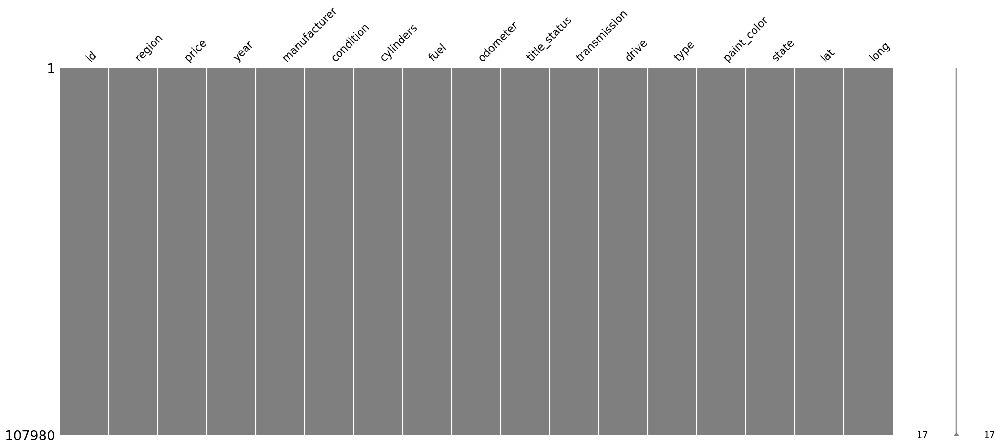

In [76]:
msno.matrix(vehicles_data, color = (0.5, 0.5, 0.5))

In [77]:
df = vehicles_data[vehicles_data['year'] == 2007]["price"]
print(df.max())

3736928711


In [78]:
df = vehicles_data[vehicles_data['year'] == 1999]["price"]
print(df.max())

1111111111


In [79]:
filtered_df = vehicles_data[vehicles_data["price"] == 3736928711]

In [80]:
vehicles_data.drop(vehicles_data[vehicles_data['price'] == 3736928711].index, inplace = True)

In [81]:
vehicles_data.drop(vehicles_data[vehicles_data['price'] == 1111111111].index, inplace = True)

In [82]:
df = vehicles_data[vehicles_data['year'] == 2015]["price"]
print(df.max())

140000


In [83]:
vehicles_data.drop(vehicles_data[vehicles_data['price'] == 123456789].index, inplace = True)
vehicles_data.drop(vehicles_data[vehicles_data['price'] == 17000000].index, inplace = True)
vehicles_data.drop(vehicles_data[vehicles_data['price'] == 6995495].index, inplace = True)
vehicles_data.drop(vehicles_data[vehicles_data['price'] == 2000000].index, inplace = True)
vehicles_data.drop(vehicles_data[vehicles_data['price'] == 1234567].index, inplace = True)
vehicles_data.drop(vehicles_data[vehicles_data['price'] == 990000].index, inplace = True)
vehicles_data.drop(vehicles_data[vehicles_data['price'] == 135008900].index, inplace = True)

In [39]:
fig = px.scatter(vehicles_data, x = 'year', y = 'price', color = 'fuel')
fig.show()

In [40]:
fig = px.scatter(vehicles_data, x = 'odometer', y = 'price', color = 'fuel')
fig.show()

In [84]:
vehicles_data_2 = vehicles_data.drop(vehicles_data[vehicles_data['odometer'] >= 5000000].index)


In [85]:
vehicles_data_2.isna().sum()

id              0
region          0
price           0
year            0
manufacturer    0
condition       0
cylinders       0
fuel            0
odometer        0
title_status    0
transmission    0
drive           0
type            0
paint_color     0
state           0
lat             0
long            0
dtype: int64

In [86]:
vehicles_data_2.dropna(subset=['condition','drive','paint_color'])

,id,region,price,year,manufacturer,condition,cylinders,fuel,odometer,title_status,transmission,drive,type,paint_color,state,lat,long
31,7316356412,auburn,15000,2013.0,ford,excellent,6,gas,128000.0,clean,automatic,rwd,truck,black,al,32.592000,-85.518900
32,7316343444,auburn,27990,2012.0,gmc,good,8,gas,68696.0,clean,other,4wd,pickup,black,al,32.590000,-85.480000
33,7316304717,auburn,34590,2016.0,chevrolet,good,6,gas,29499.0,clean,other,4wd,pickup,silver,al,32.590000,-85.480000
34,7316285779,auburn,35000,2019.0,toyota,excellent,6,gas,43000.0,clean,automatic,4wd,truck,grey,al,32.601300,-85.443974
35,7316257769,auburn,29990,2016.0,chevrolet,good,6,gas,17302.0,clean,other,4wd,pickup,red,al,32.590000,-85.480000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426859,7301952155,wyoming,48590,2020.0,cadillac,good,6,gas,7701.0,clean,other,fwd,other,black,wy,33.779214,-84.411811
426860,7301951544,wyoming,39990,2017.0,infiniti,good,8,gas,41664.0,clean,automatic,4wd,other,black,wy,33.779214,-84.411811
426866,7301949190,wyoming,32990,2016.0,infiniti,good,8,gas,55612.0,clean,automatic,rwd,other,black,wy,33.779214,-84.411811
426874,7301591199,wyoming,33590,2018.0,lexus,good,6,gas,30814.0,clean,automatic,rwd,sedan,white,wy,33.779214,-84.411811


In [87]:
vehicles_data_2.drop(vehicles_data_2[vehicles_data_2['price'] >= 11000000].index)

,id,region,price,year,manufacturer,condition,cylinders,fuel,odometer,title_status,transmission,drive,type,paint_color,state,lat,long
31,7316356412,auburn,15000,2013.0,ford,excellent,6,gas,128000.0,clean,automatic,rwd,truck,black,al,32.592000,-85.518900
32,7316343444,auburn,27990,2012.0,gmc,good,8,gas,68696.0,clean,other,4wd,pickup,black,al,32.590000,-85.480000
33,7316304717,auburn,34590,2016.0,chevrolet,good,6,gas,29499.0,clean,other,4wd,pickup,silver,al,32.590000,-85.480000
34,7316285779,auburn,35000,2019.0,toyota,excellent,6,gas,43000.0,clean,automatic,4wd,truck,grey,al,32.601300,-85.443974
35,7316257769,auburn,29990,2016.0,chevrolet,good,6,gas,17302.0,clean,other,4wd,pickup,red,al,32.590000,-85.480000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426859,7301952155,wyoming,48590,2020.0,cadillac,good,6,gas,7701.0,clean,other,fwd,other,black,wy,33.779214,-84.411811
426860,7301951544,wyoming,39990,2017.0,infiniti,good,8,gas,41664.0,clean,automatic,4wd,other,black,wy,33.779214,-84.411811
426866,7301949190,wyoming,32990,2016.0,infiniti,good,8,gas,55612.0,clean,automatic,rwd,other,black,wy,33.779214,-84.411811
426874,7301591199,wyoming,33590,2018.0,lexus,good,6,gas,30814.0,clean,automatic,rwd,sedan,white,wy,33.779214,-84.411811


In [88]:
vehicles_data_2.drop(['id'], axis=1)


,region,price,year,manufacturer,condition,cylinders,fuel,odometer,title_status,transmission,drive,type,paint_color,state,lat,long
31,auburn,15000,2013.0,ford,excellent,6,gas,128000.0,clean,automatic,rwd,truck,black,al,32.592000,-85.518900
32,auburn,27990,2012.0,gmc,good,8,gas,68696.0,clean,other,4wd,pickup,black,al,32.590000,-85.480000
33,auburn,34590,2016.0,chevrolet,good,6,gas,29499.0,clean,other,4wd,pickup,silver,al,32.590000,-85.480000
34,auburn,35000,2019.0,toyota,excellent,6,gas,43000.0,clean,automatic,4wd,truck,grey,al,32.601300,-85.443974
35,auburn,29990,2016.0,chevrolet,good,6,gas,17302.0,clean,other,4wd,pickup,red,al,32.590000,-85.480000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426859,wyoming,48590,2020.0,cadillac,good,6,gas,7701.0,clean,other,fwd,other,black,wy,33.779214,-84.411811
426860,wyoming,39990,2017.0,infiniti,good,8,gas,41664.0,clean,automatic,4wd,other,black,wy,33.779214,-84.411811
426866,wyoming,32990,2016.0,infiniti,good,8,gas,55612.0,clean,automatic,rwd,other,black,wy,33.779214,-84.411811
426874,wyoming,33590,2018.0,lexus,good,6,gas,30814.0,clean,automatic,rwd,sedan,white,wy,33.779214,-84.411811


# Encoding and Pipelining

In [89]:
#pipeline
from sklearn.model_selection import train_test_split
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.pipeline import FeatureUnion
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn import set_config
set_config(display="diagram")
#using Ordinal Encoder
from fancyimpute import KNN
from sklearn.preprocessing import OrdinalEncoder
import seaborn as sns
encoder = OrdinalEncoder()
imputer = KNN()
cat_cols = ['condition']

In [90]:
TARGET = 'price'
FEATURES = vehicles_data_2.columns.drop(TARGET)
vehicles_data_label = vehicles_data_2['price'].copy()
vehicles_data_features = vehicles_data_2.drop('price', axis=1)

NUMERICAL = vehicles_data_2[FEATURES].select_dtypes('number').columns
print(f"Numerical features: {', '.join(NUMERICAL)}")

CATEGORICAL = ['region','manufacturer','condition','fuel','title_status','transmission','drive','type','paint_color','state'] # can be automated
print(f"Categorical features: {', '.join(CATEGORICAL)}")

Numerical features: id, year, cylinders, odometer, lat, long
Categorical features: region, manufacturer, condition, fuel, title_status, transmission, drive, type, paint_color, state


In [91]:
NUM = ['year', 'cylinders', 'odometer', 'lat', 'long']
vehicles_data_features_num = vehicles_data_features.drop(columns = CATEGORICAL)
numerical_feature_names = vehicles_data_features_num.columns
vehicles_data_features_cat = vehicles_data_features.drop(columns = NUMERICAL)

# Categorical features can further be divided in Ordinal and OneHotEncoded features.
# The only feature suitable for an ordinal encoder is .
# For good results, we need to manually the desired order of the classes

ordinal_feature_names = ['condition','drive']
ordinal_feature_classes = [['salvage','fair','good','excellent','like new','new'],["fwd","rwd","4wd"]]
one_hot_feature_names = [item for item in CATEGORICAL if not item in ordinal_feature_names]
one_hot_feature_names

['region',
 'manufacturer',
 'fuel',
 'title_status',
 'transmission',
 'type',
 'paint_color',
 'state']

In [92]:
class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, feature_names):
        self.attribute_names = feature_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.attribute_names].values

In [93]:
#vehicles_data_features - Train categorical features
from sklearn.preprocessing import StandardScaler

# NUMERICAL PIPELINE
num_pipeline = Pipeline([
        ('selector', DataFrameSelector(numerical_feature_names)),
        ('std_scaler', StandardScaler())
    ])
# We run the pipeline to check, whether it runs with no problems
temp = num_pipeline.fit_transform(vehicles_data_features)

#ONE HOT PIPELINE
# One-Hot-Encoder replaces categorical features by boolean features, stating whether a certain category is true or not
one_hot_pipeline = Pipeline([
        ('selector', DataFrameSelector(one_hot_feature_names)),
        ('one_hot_encoder', OneHotEncoder(drop='first', sparse=False))
    ])

# We run the pipeline to check, whether it runs with no problems
temp = one_hot_pipeline.fit_transform(vehicles_data_features)

#ORDINAL PIPELINE
# OrdinalEncoder replaced categorical features by their position in a list.
ordinal_pipeline = Pipeline([
        ('selector', DataFrameSelector(ordinal_feature_names)),
        ('ordinal_encoder', OrdinalEncoder(categories=ordinal_feature_classes))
    ])

# We run the pipeline to check, whether it runs with no problems
temp = ordinal_pipeline.fit_transform(vehicles_data_features)

#FULL PIPELINE
#Combine both imputers and get cleaned data

full_pipeline = FeatureUnion(transformer_list=[
        ("num_pipeline", num_pipeline),
        ("one_hot_pipeline", one_hot_pipeline),
        ("ordinal_pipeline", ordinal_pipeline),
    ])
vehicles_data_prepared = full_pipeline.fit_transform(vehicles_data_features)

# Regression Models

In [97]:
#Dataset Split
#Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error
vehicles_data_prepared, vehicles_data_prepared_test, vehicles_data_label, vehicles_data_label_test = train_test_split(vehicles_data_prepared, vehicles_data_label, test_size=0.2, random_state = 365)

In [98]:
print(vehicles_data_prepared.shape)
print(vehicles_data_prepared_test.shape)
print(vehicles_data_label.shape)
print(vehicles_data_label_test.shape)

(69093, 533)
(17274, 533)
(69093,)
(17274,)


R_squared : 0.4531182666707523
RMSE : 62830.41653498781


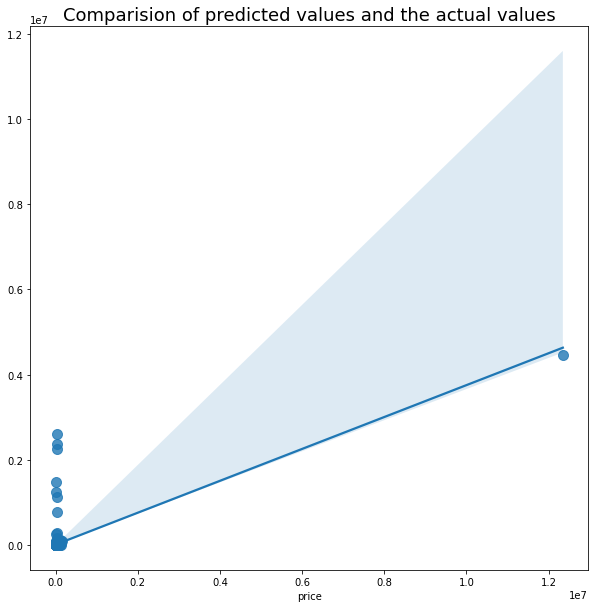

In [53]:
#Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error
rf_model = RandomForestRegressor()
rf_model.fit(vehicles_data_prepared, vehicles_data_label)
vehicles_price_predict = rf_model.predict(vehicles_data_prepared_test)

r_squared = r2_score(vehicles_data_label_test,vehicles_price_predict)
rmse = np.sqrt(mean_squared_error(vehicles_data_label_test,vehicles_price_predict))
print("R_squared :",r_squared)
print("RMSE :",rmse)

#plt.plot(vehicles_data_label_test, vehicles_price_predict,color='k') 
#plt.show()

plt.figure(figsize = (10, 10))
sns.regplot(vehicles_data_label_test, vehicles_price_predict, fit_reg=True, scatter_kws={"s": 100})
plt.title("Comparision of predicted values and the actual values", fontsize = 18)
plt.savefig('C:/Users/Riya Mangal/Documents/Random_Forest_Regressor_outcome.png')
plt.show()

R_squared : 0.7495012831607981
RMSE : 42523.204293006864


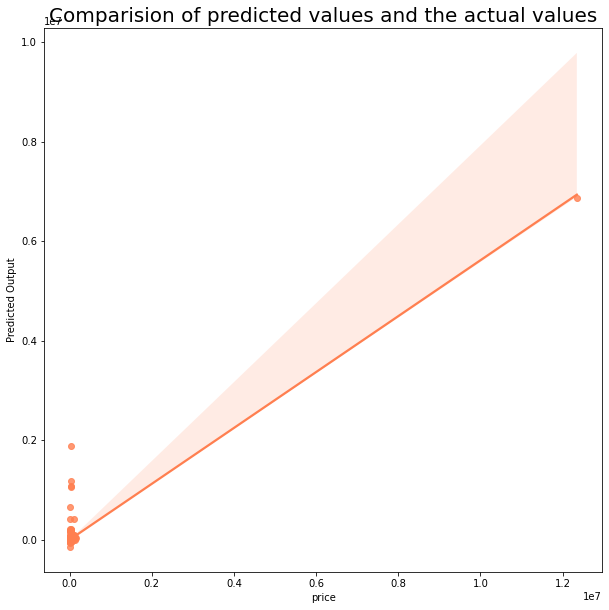

In [183]:
#Gradient Booster
from sklearn.ensemble import GradientBoostingRegressor
gbt_model = GradientBoostingRegressor()

# Training Model
gbt_model.fit(vehicles_data_prepared, vehicles_data_label)

# Model Summary
gbt_price_predict = gbt_model.predict(vehicles_data_prepared_test)
gbt_price_predict = pd.DataFrame(gbt_price_predict, columns = ['Predicted Output'])
gbt_results = pd.concat([gbt_price_predict, vehicles_data_label_test.to_frame().reset_index(drop = True)], axis = 1, ignore_index = False)

gbt_rsquared = r2_score(vehicles_data_label_test,gbt_price_predict)
gbt_rmse = np.sqrt(mean_squared_error(vehicles_data_label_test,gbt_price_predict))
print("R_squared :",gbt_rsquared)
print("RMSE :",gbt_rmse)

#plt.plot(vehicles_data_label_test, vehicles_price_predict,color='k') 
#plt.show()

plt.figure(figsize = (10, 10))
sns.regplot(data = gbt_results, y = 'Predicted Output', x = 'price', color = 'coral', marker = 'o')
plt.title("Comparision of predicted values and the actual values", fontsize = 18)
plt.savefig('C:/Users/Riya Mangal/Documents/Gradient_booster_outcome.png')
plt.show()

R_squared : 0.9979043032784374
RMSE : 6103.961387915162


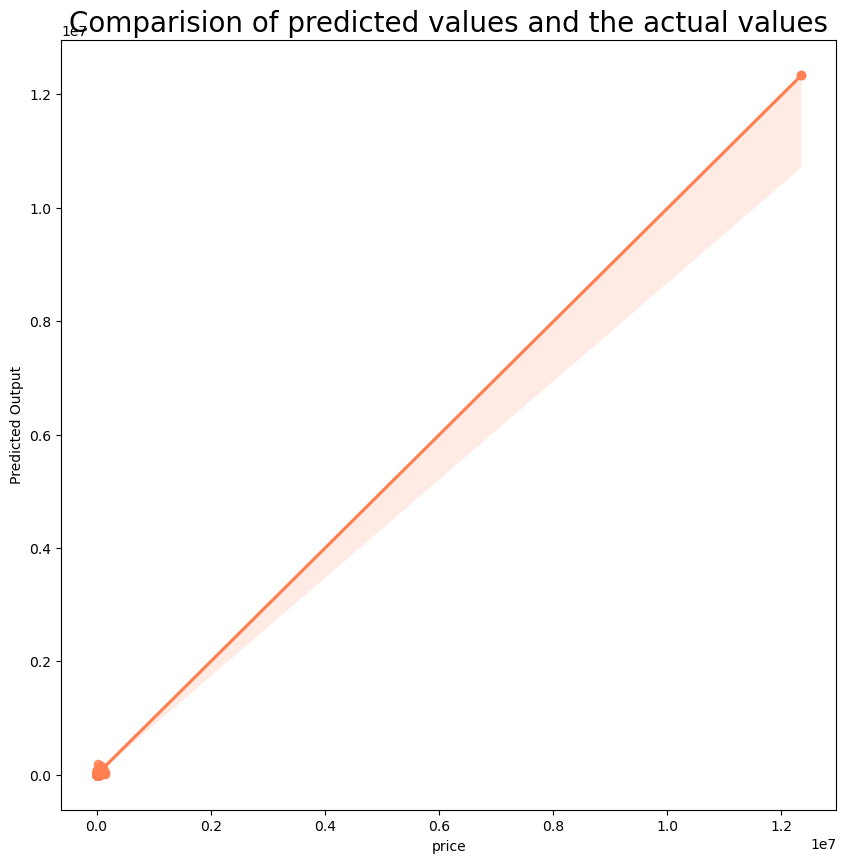

In [100]:
#Decison Tree Regressor

from sklearn.tree import DecisionTreeRegressor
import seaborn as sns

dtr_model = DecisionTreeRegressor(splitter = 'random')
dtr_model.fit(vehicles_data_prepared, vehicles_data_label)
dtr_price_predict = dtr_model.predict(vehicles_data_prepared_test)
dtr_price_predict = pd.DataFrame(dtr_price_predict, columns = ['Predicted Output'])
dtr_results = pd.concat([dtr_price_predict, vehicles_data_label_test.to_frame().reset_index(drop = True)], axis = 1, ignore_index = False)


dtr_rsquared = r2_score(vehicles_data_label_test,dtr_price_predict)
dtr_rmse = np.sqrt(mean_squared_error(vehicles_data_label_test,dtr_price_predict))
print("R_squared :",dtr_rsquared)
print("RMSE :",dtr_rmse)

#plt.plot(vehicles_data_prepared_test,model.predict(vehicles_data_prepared_test),color='k') 
#plt.show()

plt.figure(figsize = (10, 10))
sns.regplot(data = dtr_results, y = 'Predicted Output', x = 'price', color = 'coral', marker = 'o')
plt.title("Comparision of predicted values and the actual values", fontsize = 20)
#plt.savefig('C:/Users/Riya Mangal/Documents/Decision_tree_regressor_outcome.png')
plt.show()




In [103]:
dtr_price_predict

,Predicted Output
0,14988.00
1,21995.00
2,7985.00
3,9200.00
4,1.00
...,...
17269,35590.00
17270,2595.00
17271,29900.00
17272,4295.00


In [104]:
# Finally, let's manually check these predictions
# To obtain the actual prices, we take the exponential of the log_price
import numpy as np
vehicles_data_3 = vehicles_data_2.copy()
vehicles_data_3 = pd.DataFrame(np.exp(dtr_price_predict), columns=['Predicted Price'])

# We can also include the Actual price column in that data frame (so we can manually compare them)
vehicles_data_label_test = vehicles_data_label_test.reset_index(drop=True)
vehicles_data_3['Actual Price'] = np.exp(vehicles_data_label_test)
vehicles_data_3['Actual Price']

0        inf
1        inf
2        inf
3        inf
4       2.72
        ... 
17269    inf
17270    inf
17271    inf
17272    inf
17273    inf
Name: Actual Price, Length: 17274, dtype: float64

In [105]:
# we can calculate the difference between the targets and the predictions
vehicles_data_3['Residual'] = vehicles_data_3['Actual Price'] - vehicles_data_3['Predicted Price']
vehicles_data_3['Difference%'] = np.absolute(vehicles_data_3['Residual']/vehicles_data_3['Actual Price']*100)

pd.set_option('display.float_format', lambda x: '%.2f' % x)
vehicles_data_3.sort_values(by=['Difference%'])

vehicles_data_3.tail(5)

,Predicted Price,Actual Price,Residual,Difference%
17269,NaN,inf,NaN,NaN
17270,NaN,inf,NaN,NaN
17271,NaN,inf,NaN,NaN
17272,NaN,inf,NaN,NaN
17273,NaN,inf,NaN,NaN


In [2]:
#Simple Linear regression
from sklearn.linear_model import LinearRegression
from matplotlib import pyplot as plt
from sklearn.metrics import mean_squared_error 
from sklearn.metrics import r2_score
lr_model = LinearRegression()
lr_model.fit(vehicles_data_prepared, vehicles_data_label)
lr_price_predict = lr_model.predict(vehicles_data_prepared_test)
lr_price_predict = pd.DataFrame(lr_price_predict, columns = ['Predicted Output'])
lr_results = pd.concat([lr_price_predict, vehicles_data_label_test.to_frame().reset_index(drop = True)], axis = 1, ignore_index = False)


#error_mean_square.append(int(mean_squared_error(vehicles_price_predict, vehicles_data_label_test)))
#error_mean_absolute.append(int(mean_absolute_error(vehicles_price_predict, vehicles_data_label_test)))



lr_rsquared = r2_score(vehicles_data_label_test,lr_price_predict)
lr_rmse = np.sqrt(mean_squared_error(vehicles_data_label_test,lr_price_predict))
print("R_squared :",lr_rsquared)
print("RMSE :",lr_rmse)

#plt.plot(vehicles_data_prepared_test,model.predict(vehicles_data_prepared_test),color='k') 
#plt.show()

plt.figure(figsize = (10, 10))
sns.regplot(data = lr_results, y = 'Predicted Output', x = 'price', color = 'coral', marker = 'o')
plt.title("Comparision of predicted values and the actual values", fontsize = 20)
#plt.savefig('C:/Users/Riya Mangal/Documents/Linear_regressor_outcome.png')
plt.show()

NameError: name 'vehicles_data_prepared' is not defined

In [3]:
#K-neighbors regressor
from sklearn.neighbors import KNeighborsRegressor

kn_model = KNeighborsRegressor(n_neighbors = 2)
kn_model.fit(vehicles_data_prepared, vehicles_data_label)

kn_predict = kn_model.predict(vehicles_data_prepared_test)
kn_predict = pd.DataFrame(kn_predict, columns = ['Predicted Output'])
kn_results = pd.concat([kn_predict, vehicles_data_label_test.to_frame().reset_index(drop = True)], axis = 1, ignore_index = False)

plt.figure(figsize = (10, 10))
sns.regplot(data = kn_results, y = 'Predicted Output', x = 'MSRP', color = 'darkslateblue', marker = 'o')
plt.title("Comparision of predicted values and the actual values", fontsize = 20)
plt.savefig('C:/Users/Riya Mangal/Documents/K_nearest_neighbors_outcome.png')
plt.show()

NameError: name 'vehicles_data_prepared' is not defined

# Mean Absolute Error of Models

In [ ]:
plt.figure(figsize = (20, 10))
splot = sns.barplot(data = model_dataframe, x = 'Models', y = 'Mean Absolute Error', palette = 'Paired')
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.0f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
plt.xticks(fontsize = 13)
plt.yticks(fontsize = 13)
plt.title("Barplot of various machine learning regression models with mean absolute error", fontsize = 20)
plt.savefig('C:/Users/Riya Mangal/Documents/machine_learning_models_outcomes.png')
plt.show()

# Mean Squared Error of Models

In [ ]:
plt.figure(figsize = (20, 10))
splot = sns.barplot(data = model_dataframe, x = 'Models', y = 'Mean Squared Error', palette = 'Spectral')
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.0f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
plt.xticks(fontsize = 13)
plt.yticks(fontsize = 13)
plt.title("Barplot of various machine learning regression models with mean squared error", fontsize = 20)
plt.savefig('images/machine_learning_models_MSE_outcomes.png')
plt.show()